In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("kashiwaba/megadepth-v1-p2")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/megadepth-v1-p2


In [3]:
!pip install deepdish

In [3]:
import sys
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import deepdish as dd

In [6]:
os.listdir('/kaggle/input/')


['megadepth-v1-p2']

In [4]:
!pip install kornia
!git clone https://github.com/zju3dv/LoFTR.git
%cd LoFTR
!pip install -r requirements.txt
!pip install .


fatal: destination path 'LoFTR' already exists and is not an empty directory.
/kaggle/working/LoFTR
  Using cached opencv-python-4.4.0.46.tar.gz (88.9 MB)
  Installing build dependencies ... ^C
canceled
ERROR: Operation cancelled by user
ERROR: Directory '.' is not installable. Neither 'setup.py' nor 'pyproject.toml' found.


In [5]:
pip install opencv-python-headless torch kornia matplotlib


Note: you may need to restart the kernel to use updated packages.


In [6]:
!git clone https://github.com/zju3dv/LoFTR.git
%cd LoFTR

# Install necessary dependencies
!pip install -q opencv-python-headless torch kornia matplotlib


fatal: destination path 'LoFTR' already exists and is not an empty directory.
/kaggle/working/LoFTR/LoFTR


In [7]:
%cd /kaggle/working/LoFTR/LoFTR


/kaggle/working/LoFTR/LoFTR


In [8]:
!pip install -q opencv-python-headless torch kornia matplotlib


In [9]:
import sys
sys.path.append('/kaggle/working/LoFTR/LoFTR')


In [10]:
!pip install -q opencv-python-headless torch kornia matplotlib


In [12]:
!ls /kaggle/working/LoFTR/LoFTR


assets	 demo		   LICENSE    README.md		src	     train.py
configs  docs		   LoFTR      requirements.txt	test.py
data	 environment.yaml  notebooks  scripts		third_party


In [13]:
import sys
sys.path.append('/kaggle/working/LoFTR/LoFTR/src')


In [14]:
!pip install yacs


In [15]:
!ls /kaggle/working/LoFTR/LoFTR/src/loftr/utils


coarse_matching.py  fine_matching.py  position_encoding.py  supervision.py
cvpr_ds_config.py   geometry.py       __pycache__


In [16]:
import torch
import cv2
import matplotlib.pyplot as plt
from loftr import LoFTR
#from loftr.utils.plotting import make_matching_plot

In [2]:
# Load images (make sure they're grayscale)
img0_path = '/kaggle/input/megadepth-v1-p2/MegaDepth_v1_p2/0048/dense0/imgs/1119628220_8328721e8b_o.jpg'  # Path to image 1
img1_path = '//kaggle/input/megadepth-v1-p2/MegaDepth_v1_p2/0048/dense0/imgs/1125324576_ed37cfe788_o.jpg'  # Path to image 2


In [25]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np
from loftr import LoFTR

def resize_to_divisible_by_8(img):
    h, w = img.shape[:2]
    new_h = h - (h % 8)
    new_w = w - (w % 8)
    return cv2.resize(img, (new_w, new_h))

# Resize both images
img0 = resize_to_divisible_by_8(img0)
img1 = resize_to_divisible_by_8(img1)



img0 = cv2.imread(img0_path, cv2.IMREAD_GRAYSCALE)
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)

# Convert to tensors
img0_tensor = torch.from_numpy(img0)[None][None].float() / 255.
img1_tensor = torch.from_numpy(img1)[None][None].float() / 255.

# Select device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
img0_tensor = img0_tensor.to(device)
img1_tensor = img1_tensor.to(device)

# Initialize LoFTR model
matcher = LoFTR(config=default_cfg).to(device)


In [26]:
# Load the checkpoint
checkpoint = torch.load('/kaggle/input/outpose/other/default/1/outdoor_ds.ckpt')

# Extract the state_dict from the checkpoint
state_dict = checkpoint['state_dict']

# Load the state_dict into your model
matcher.load_state_dict(state_dict)



/tmp/ipykernel_1827/3483537243.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/kaggle/input/outpose/other/default/1/outdoor_ds.ckpt')


<All keys matched successfully>

In [32]:
!find . -name "*.py" | xargs grep "def get_cfg_defaults"


./src/config/default.py:def get_cfg_defaults():
./LoFTR/src/config/default.py:def get_cfg_defaults():
./LoFTR/LoFTR/src/config/default.py:def get_cfg_defaults():


In [33]:
from LoFTR.src.config.default import get_cfg_defaults


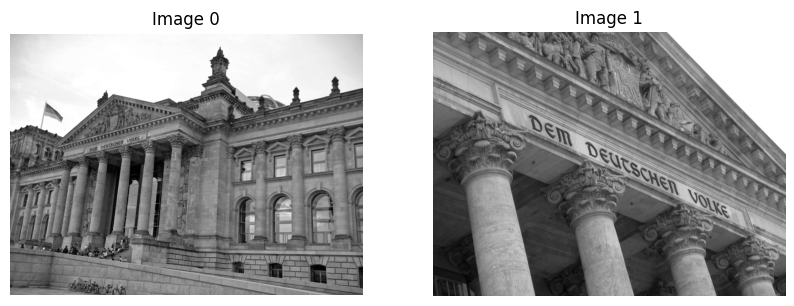

In [54]:
# Display the images to check them
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img0, cmap='gray')
plt.title('Image 0')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img1, cmap='gray')
plt.title('Image 1')
plt.axis('off')

plt.show()


In [55]:
# Normalize images to [0, 1] range (LoFTR expects images in this range)
img0_tensor = torch.from_numpy(img0)[None][None].float() / 255.
img1_tensor = torch.from_numpy(img1)[None][None].float() / 255.

# Move tensors to the appropriate device (GPU or CPU)
img0_tensor = img0_tensor.to(device)
img1_tensor = img1_tensor.to(device)


In [56]:
# Print model to ensure it's loaded correctly
print(matcher)


LoFTR(
  (backbone): ResNetFPN_8_2(
    (conv1): Conv2d(1, 128, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1

In [57]:
# Perform feature matching
with torch.no_grad():
    correspondences = matcher(input_dict)

# Print out correspondences to see if they contain any useful data
print("Correspondences:", correspondences)

# Check for empty or None correspondences
if not correspondences or correspondences['keypoints0'].size == 0:
    print("No correspondences found.")


Correspondences: None
No correspondences found.


In [59]:
# Load images
img0 = cv2.imread(img0_path, cv2.IMREAD_GRAYSCALE)
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)  # Load img1 as well

# Check if images are loaded correctly
if img0 is None or img1 is None:
    raise ValueError("Images could not be loaded. Please check the file paths.")

# Rotate img1 if necessary
#img1 = cv2.rotate(img1, cv2.ROTATE_90_CLOCKWISE)  # Rotate one of the images

# Resize images
img0 = resize_image(img0)
img1 = resize_image(img1)

# Convert images to tensors
img0_tensor = torch.from_numpy(img0)[None][None].float() / 255.
img1_tensor = torch.from_numpy(img1)[None][None].float() / 255.

# Continue with the rest of your code...


In [60]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np
from loftr import LoFTR
from loftr.utils.cvpr_ds_config import default_cfg  # Ensure this import works

# ---------- STEP 1: Load and Resize ----------
def resize_image(img, max_dim=1024):
    h, w = img.shape[:2]
    if max(h, w) > max_dim:
        scale = max_dim / float(max(h, w))
        new_w = int(w * scale)
        new_h = int(h * scale)
        img = cv2.resize(img, (new_w, new_h))
    return img

"""# Load images
img0 = cv2.imread(img0_path, cv2.IMREAD_GRAYSCALE)
#img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img1 = cv2.rotate(img1_path, cv2.ROTATE_90_CLOCKWISE)  # Rotate one of the images


# Check if images are loaded correctly
if img0 is None or img1 is None:
    raise ValueError("Images could not be loaded. Please check the file paths.")

# Resize images
img0 = resize_image(img0)
img1 = resize_image(img1)

# Convert images to tensors
img0_tensor = torch.from_numpy(img0)[None][None].float() / 255.
img1_tensor = torch.from_numpy(img1)[None][None].float() / 255.

"""# Select device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
img0_tensor = img0_tensor.to(device)
img1_tensor = img1_tensor.to(device)

# Initialize LoFTR model with the default configuration
matcher = LoFTR(config=default_cfg).to(device)

# Load the checkpoint (with weights_only=True)
checkpoint = torch.load('/kaggle/input/outpose/other/default/1/outdoor_ds.ckpt', weights_only=True)
state_dict = checkpoint['state_dict']

# Load the state_dict into your model
matcher.load_state_dict(state_dict)

# Set the model to evaluation mode
matcher = matcher.eval()

# ---------- STEP 2: Run feature matching ----------
# Prepare the input dictionary
input_dict = {"image0": img0_tensor, "image1": img1_tensor}

# Clear cache before running the matching
torch.cuda.empty_cache()

# Perform feature matching
with torch.no_grad():
    correspondences = matcher(input_dict)

# Check if correspondences are None or empty
if correspondences is None:
    raise ValueError("LoFTR did not return any correspondences.")
else:
    print(f"Correspondences: {correspondences}")

# Get keypoints and confidence scores
mkpts0 = correspondences['keypoints0'].cpu().numpy()
mkpts1 = correspondences['keypoints1'].cpu().numpy()
confidence = correspondences['confidence'].cpu().numpy()

# Convert keypoints to OpenCV KeyPoint format for visualization
keypoints0 = [cv2.KeyPoint(x, y, 1) for x, y in mkpts0]
keypoints1 = [cv2.KeyPoint(x, y, 1) for x, y in mkpts1]

# Match keypoints based on correspondences
matches = []
for i in range(len(mkpts0)):
    if confidence[i] > 0.5:  # Confidence threshold to filter good matches
        match = cv2.DMatch(_queryIdx=i, _trainIdx=i, _imgIdx=0, _distance=1.0)
        matches.append(match)

# ---------- STEP 3: Visualize the matches ----------
# Visualize the matches between images
img_matches = cv2.drawMatches(img0, keypoints0, img1, keypoints1, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matched image using Matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(img_matches)
plt.axis('off')  # Hide axes
plt.show()


ValueError: LoFTR did not return any correspondences.

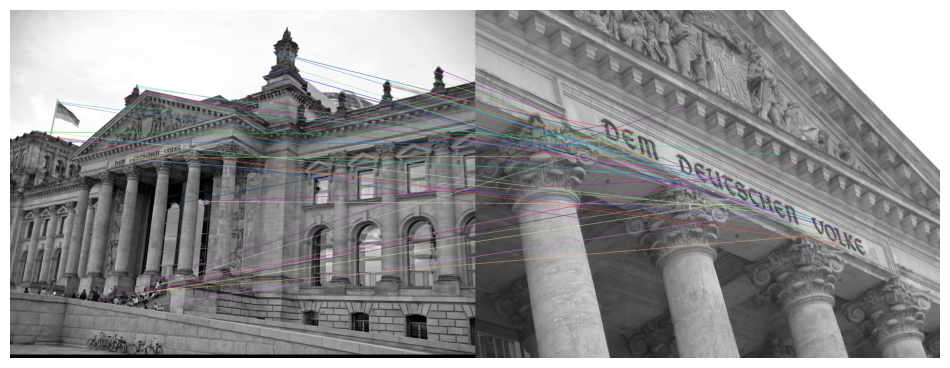

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------- STEP 1: Load images ----------
img0 = cv2.imread(img0_path, cv2.IMREAD_GRAYSCALE)
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)

if img0 is None or img1 is None:
    raise ValueError("Images could not be loaded. Please check the file paths.")

# ---------- STEP 2: Initialize ORB detector ----------
orb = cv2.ORB_create()

# ---------- STEP 3: Detect keypoints and descriptors ----------
kp0, des0 = orb.detectAndCompute(img0, None)
kp1, des1 = orb.detectAndCompute(img1, None)

# ---------- STEP 4: Use BFMatcher to find the best matches ----------
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des0, des1)

# Sort matches based on distance
matches = sorted(matches, key = lambda x:x.distance)

# ---------- STEP 5: Visualize matches ----------
# Draw the matches
img_matches = cv2.drawMatches(img0, kp0, img1, kp1, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matched image
plt.figure(figsize=(12, 8))
plt.imshow(img_matches)
plt.axis('off')  # Hide axes
plt.show()


In [5]:
print(matches)

[< cv2.DMatch 0x7c21f6d6fa90>, < cv2.DMatch 0x7c21f6d6fb30>, < cv2.DMatch 0x7c21f6d6fa30>, < cv2.DMatch 0x7c21f6d6f7f0>, < cv2.DMatch 0x7c21f6d6fbf0>, < cv2.DMatch 0x7c21f6d6f850>, < cv2.DMatch 0x7c21f6d6f970>, < cv2.DMatch 0x7c21f6d6fb70>, < cv2.DMatch 0x7c22067a0790>, < cv2.DMatch 0x7c21f6d6f330>, < cv2.DMatch 0x7c21f6d6fa50>, < cv2.DMatch 0x7c21f6d6f110>, < cv2.DMatch 0x7c21f6d6efd0>, < cv2.DMatch 0x7c21f6d6ef70>, < cv2.DMatch 0x7c21f6d6f1f0>, < cv2.DMatch 0x7c21f6d6efb0>, < cv2.DMatch 0x7c21f6d6f010>, < cv2.DMatch 0x7c21f6d6fbb0>, < cv2.DMatch 0x7c21f6d6f2f0>, < cv2.DMatch 0x7c21f6d6f6f0>, < cv2.DMatch 0x7c21f6d6f270>, < cv2.DMatch 0x7c21f6d6f910>, < cv2.DMatch 0x7c21f6d6fb90>, < cv2.DMatch 0x7c21f6d6eff0>, < cv2.DMatch 0x7c21f6d6f5d0>, < cv2.DMatch 0x7c21f6d6f410>, < cv2.DMatch 0x7c21f6d6f490>, < cv2.DMatch 0x7c21f6d6f4f0>, < cv2.DMatch 0x7c21f6d6f670>, < cv2.DMatch 0x7c21f6d6f7d0>, < cv2.DMatch 0x7c21f6d6f810>, < cv2.DMatch 0x7c21f6d6fa10>, < cv2.DMatch 0x7c21f6d6f0d0>, < cv2.DMa

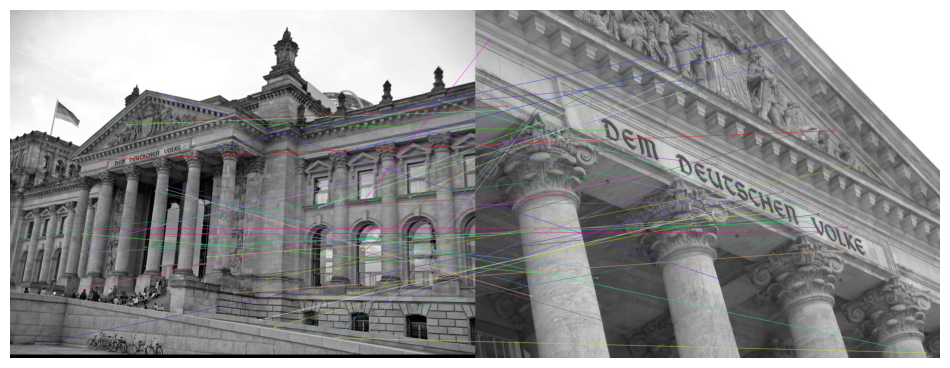

In [6]:
# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
kp0, des0 = sift.detectAndCompute(img0, None)
kp1, des1 = sift.detectAndCompute(img1, None)

# Use Brute-Force Matcher to find matches
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des0, des1)

# Sort matches based on their distance
matches = sorted(matches, key=lambda x: x.distance)

# Visualize the matches
img_matches = cv2.drawMatches(img0, kp0, img1, kp1, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(12, 8))
plt.imshow(img_matches)
plt.axis('off')
plt.show()


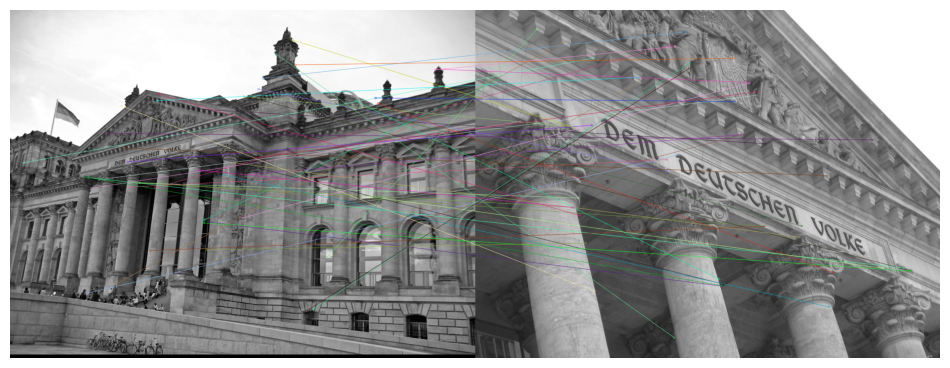

In [7]:
# Initialize AKAZE detector
akaze = cv2.AKAZE_create()

# Detect keypoints and descriptors
kp0, des0 = akaze.detectAndCompute(img0, None)
kp1, des1 = akaze.detectAndCompute(img1, None)

# Use Brute-Force Matcher to find matches
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des0, des1)

# Sort matches based on their distance
matches = sorted(matches, key=lambda x: x.distance)

# Visualize the matches
img_matches = cv2.drawMatches(img0, kp0, img1, kp1, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(12, 8))
plt.imshow(img_matches)
plt.axis('off')
plt.show()


In [9]:
def resize_image(img, max_dim=1024):
    h, w = img.shape[:2]
    if max(h, w) > max_dim:
        scale = max_dim / float(max(h, w))
        new_w = int(w * scale)
        new_h = int(h * scale)
        img = cv2.resize(img, (new_w, new_h))
    return img

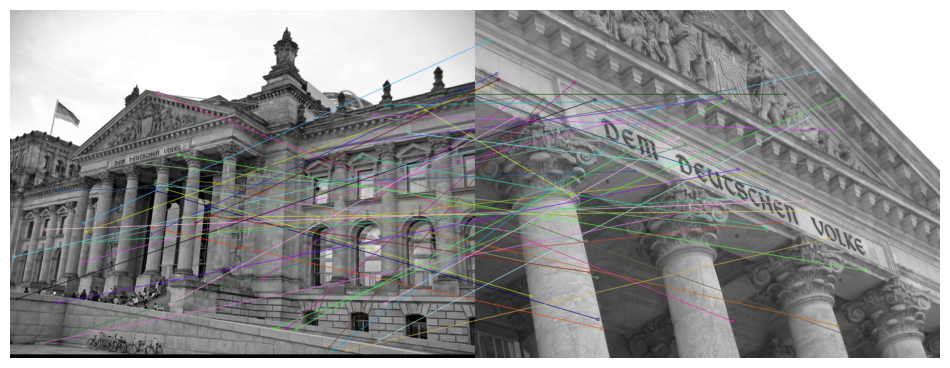

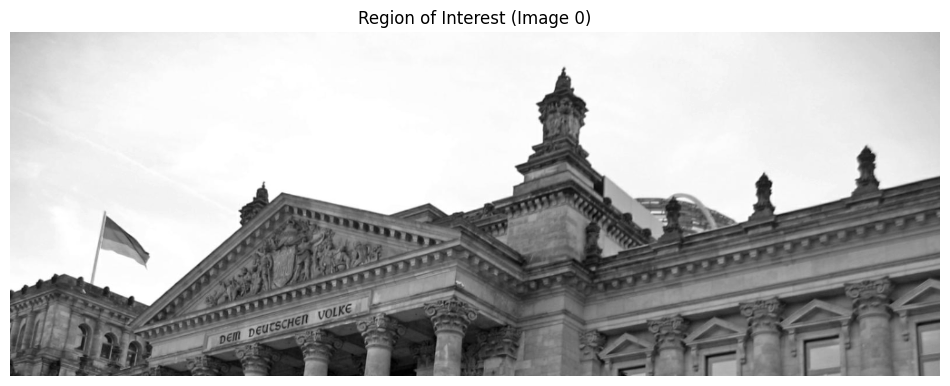

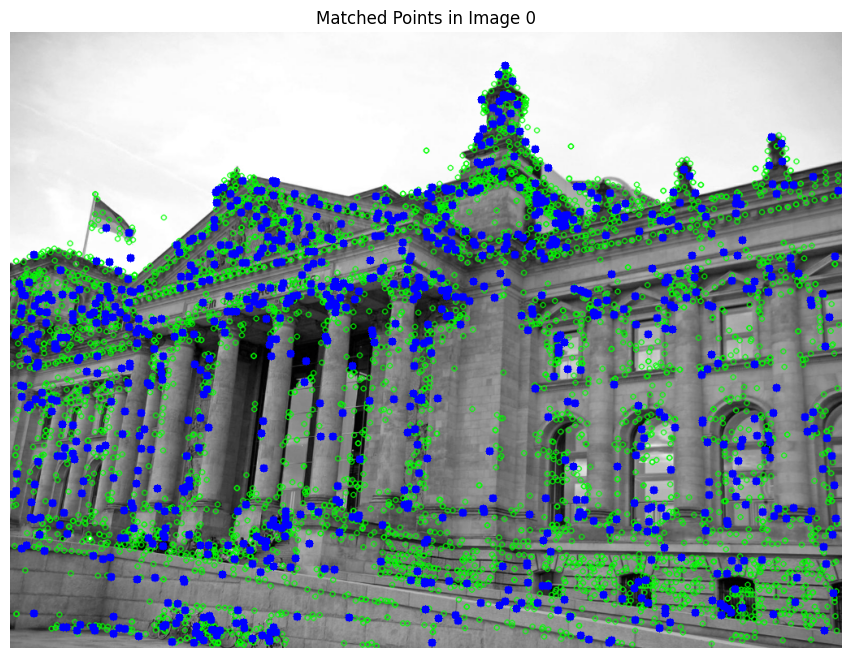

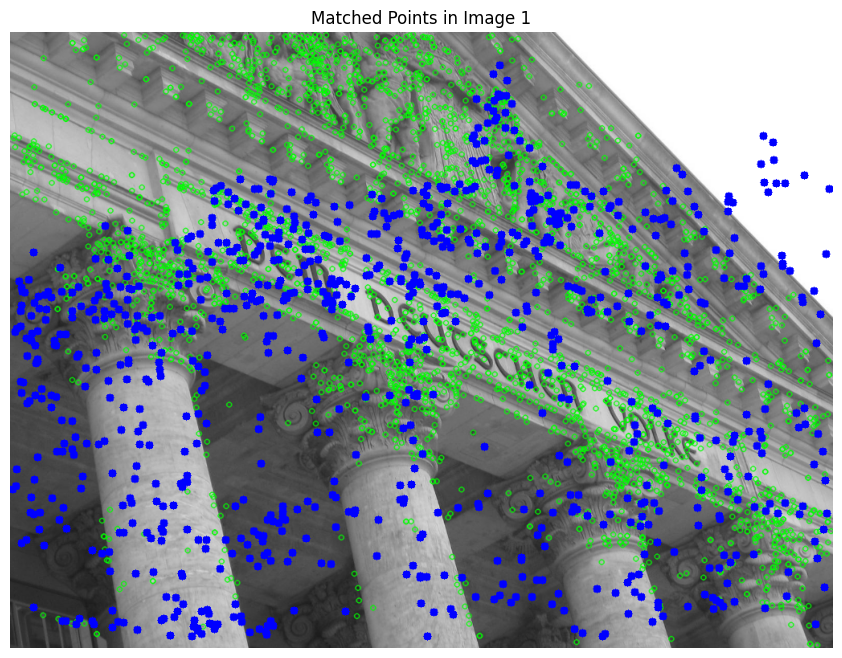

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images
img0 = cv2.imread(img0_path, cv2.IMREAD_GRAYSCALE)
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)

# Resize images if needed
img0 = resize_image(img0)
img1 = resize_image(img1)

# Initialize feature detector (SIFT, ORB, or AKAZE)
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
kp0, des0 = sift.detectAndCompute(img0, None)
kp1, des1 = sift.detectAndCompute(img1, None)

# Use Brute-Force Matcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des0, des1)

# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Extract matched points (keypoints)
points0 = np.array([kp0[m.queryIdx].pt for m in matches])
points1 = np.array([kp1[m.trainIdx].pt for m in matches])

# Visualize matches between Image 0 and Image 1
img_matches = cv2.drawMatches(img0, kp0, img1, kp1, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(12, 8))
plt.imshow(img_matches)
plt.axis('off')
plt.show()

# Now for Area-to-Point Matching, let's assume you define a region of interest (ROI)
height, width = img0.shape  # Assuming img0 is the reference image

# Define the region as the upper half of the image
y1, x1 = 0, 0  # Start from the top-left corner
height_roi = height // 2  # Half the height of the image
width_roi = width  # Full width of the image

# Extract the region (upper half of the image)
roi_img0 = img0[y1:y1+height_roi, x1:x1+width_roi]

# Visualize ROI from the first image
plt.figure(figsize=(12, 8))
plt.imshow(roi_img0, cmap='gray')
plt.title('Region of Interest (Image 0)')
plt.axis('off')
plt.show()

# Now, check for corresponding points in the second image
# Match the region from Image 0 with points in Image 1 (based on keypoints and descriptors)

# Example: Find the closest match to each point in the region
region_points = []

for point in points0:
    x, y = point
    if x1 <= x < x1 + width and y1 <= y < y1 + height:
        region_points.append((x, y))

# Visualize the matched region points on Image 0 (in red)
img0_with_matches = cv2.drawKeypoints(img0, kp0, None, color=(0, 255, 0))  # Draw keypoints in green

# Draw circles on Image 0 for matched region points (in red)
for pt in region_points:
    cv2.circle(img0_with_matches, (int(pt[0]), int(pt[1])), 5, (0, 0, 255), -1)

# Show the final Image 0 with matched points
plt.figure(figsize=(12, 8))
plt.imshow(img0_with_matches, cmap='gray')
plt.title('Matched Points in Image 0')
plt.axis('off')
plt.show()

# Visualize the region points on Image 1 (already done)
img1_with_matches = cv2.drawKeypoints(img1, kp1, None, color=(0, 255, 0))  # Draw keypoints in green

# Draw circles on Image 1 for matched region points (in red)
for pt in region_points:
    cv2.circle(img1_with_matches, (int(pt[0]), int(pt[1])), 5, (0, 0, 255), -1)

# Show the final Image 1 with matched points
plt.figure(figsize=(12, 8))
plt.imshow(img1_with_matches, cmap='gray')
plt.title('Matched Points in Image 1')
plt.axis('off')
plt.show()


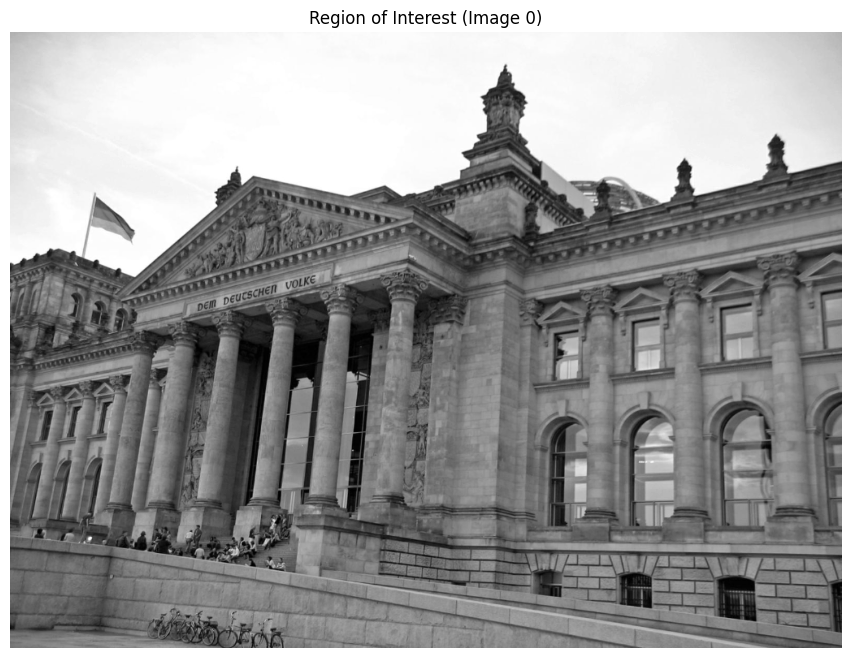

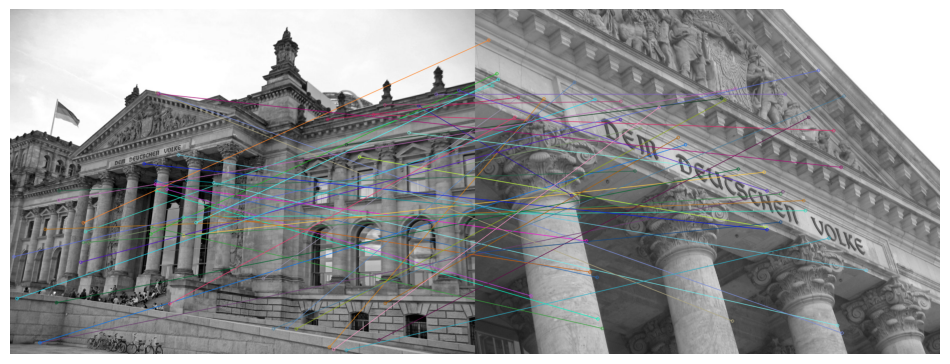

In [16]:
# Extract the region from the first image (Image 0)
roi_img0 = img0[y1:y1+height, x1:x1+width]

# Visualize ROI from the first image
plt.figure(figsize=(12, 8))
plt.imshow(roi_img0, cmap='gray')
plt.title('Region of Interest (Image 0)')
plt.axis('off')
plt.show()

# Detect keypoints and descriptors for the region (ROI) in Image 0
kp0_roi, des0_roi = sift.detectAndCompute(roi_img0, None)

# Now we need to find matching keypoints from Image 1
# Extract the region from Image 1 that corresponds to the same area
roi_img1 = img1[y1:y1+height, x1:x1+width]

# Detect keypoints and descriptors for the region (ROI) in Image 1
kp1_roi, des1_roi = sift.detectAndCompute(roi_img1, None)

# Use Brute-Force Matcher for matching descriptors in the ROI regions
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches_roi = bf.match(des0_roi, des1_roi)

# Sort matches by distance
matches_roi = sorted(matches_roi, key=lambda x: x.distance)

# Visualize matches between the ROIs in Image 0 and Image 1
img_roi_matches = cv2.drawMatches(roi_img0, kp0_roi, roi_img1, kp1_roi, matches_roi[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(12, 8))
plt.imshow(img_roi_matches)
plt.axis('off')
plt.show()


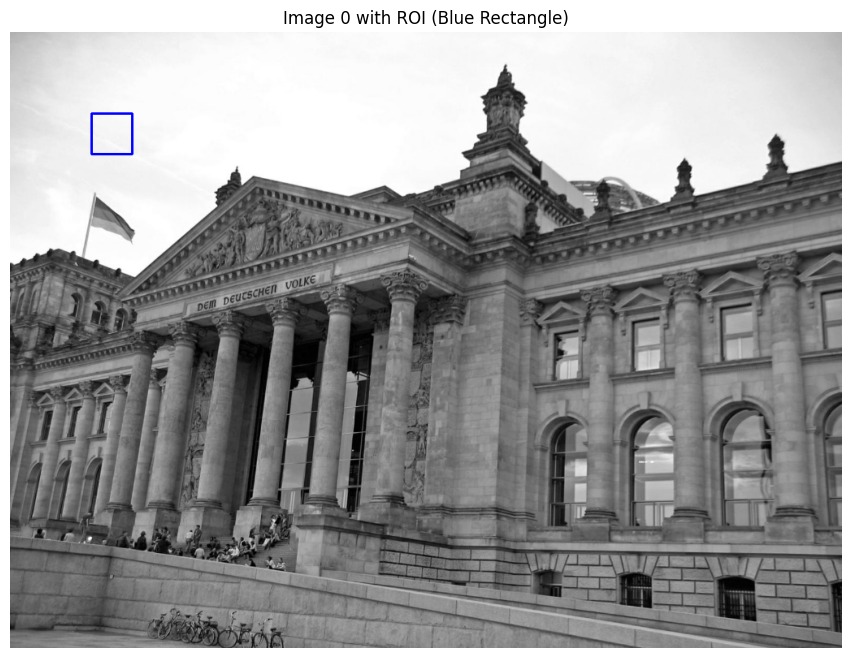

In [13]:
# Draw rectangle to visualize ROI in original image
img0_with_roi = cv2.cvtColor(img0.copy(), cv2.COLOR_GRAY2BGR)
cv2.rectangle(img0_with_roi, (x1, y1), (x1 + width, y1 + height), (0, 0, 255), 2)  # Blue rectangle

# Show the ROI overlayed on original image
plt.figure(figsize=(12, 8))
plt.imshow(img0_with_roi)
plt.title('Image 0 with ROI (Blue Rectangle)')
plt.axis('off')
plt.show()


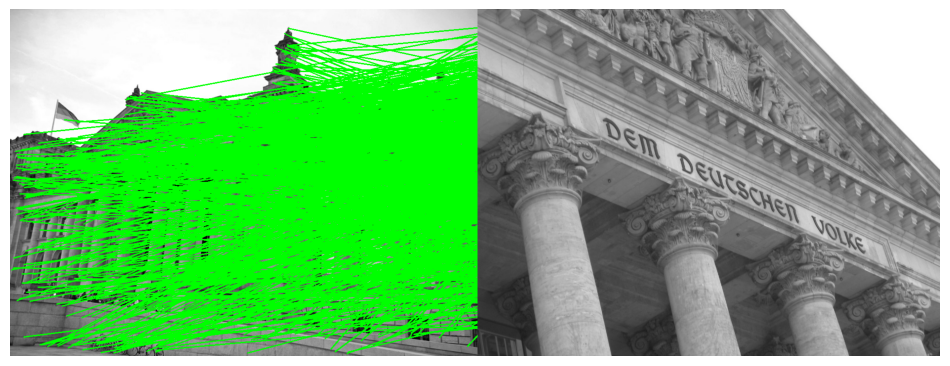

In [70]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images
img0 = cv2.imread(img0_path, cv2.IMREAD_GRAYSCALE)
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)

# Resize images if needed
img0 = resize_image(img0)
img1 = resize_image(img1)

# Initialize feature detector (SIFT, ORB, or AKAZE)
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
kp0, des0 = sift.detectAndCompute(img0, None)
kp1, des1 = sift.detectAndCompute(img1, None)

# Use Brute-Force Matcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des0, des1)

# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Extract matched points (keypoints)
points0 = np.array([kp0[m.queryIdx].pt for m in matches])
points1 = np.array([kp1[m.trainIdx].pt for m in matches])

# Visualize matches with lines connecting the points
# Create empty images to draw matches with lines
img0_color = cv2.cvtColor(img0, cv2.COLOR_GRAY2BGR)
img1_color = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)

# Define colors for lines
line_color = (0, 255, 0)  # Green lines

# Draw lines between matched points
for pt0, pt1 in zip(points0, points1):
    # Convert points to integer
    pt0 = tuple(np.round(pt0).astype(int))
    pt1 = tuple(np.round(pt1).astype(int))

    # Draw line between the matched points
    cv2.line(img0_color, pt0, (pt1[0] + img0.shape[1], pt1[1]), line_color, 2)

# Resize images to the same height (for concatenation)
height = min(img0_color.shape[0], img1_color.shape[0])
img0_resized = cv2.resize(img0_color, (int(img0_color.shape[1] * height / img0_color.shape[0]), height))
img1_resized = cv2.resize(img1_color, (int(img1_color.shape[1] * height / img1_color.shape[0]), height))

# Concatenate the two images horizontally to show them side by side
img_combined = np.concatenate((img0_resized, img1_resized), axis=1)

# Display the combined image with lines
plt.figure(figsize=(12, 8))
plt.imshow(img_combined)
plt.axis('off')
plt.show()


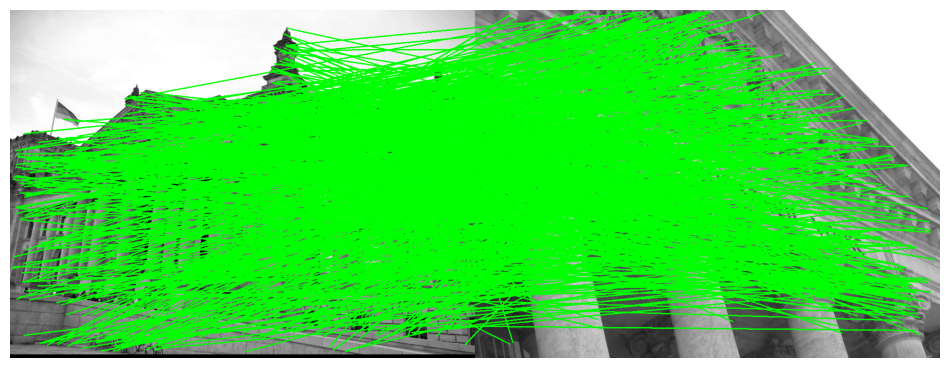

In [72]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images
img0 = cv2.imread(img0_path, cv2.IMREAD_GRAYSCALE)
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)

# Resize images if needed
img0 = resize_image(img0)
img1 = resize_image(img1)

# Initialize feature detector (SIFT, ORB, or AKAZE)
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
kp0, des0 = sift.detectAndCompute(img0, None)
kp1, des1 = sift.detectAndCompute(img1, None)

# Use Brute-Force Matcher
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des0, des1)

# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Extract matched points (keypoints)
points0 = np.array([kp0[m.queryIdx].pt for m in matches])
points1 = np.array([kp1[m.trainIdx].pt for m in matches])

# Convert to color images to draw keypoints and lines
img0_color = cv2.cvtColor(img0, cv2.COLOR_GRAY2BGR)
img1_color = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)

# Define the color for the lines (Green)
line_color = (0, 255, 0)

# Create a combined image to draw lines between matching points
height = max(img0_color.shape[0], img1_color.shape[0])  # Max height of the two images
img_combined = np.zeros((height, img0_color.shape[1] + img1_color.shape[1], 3), dtype=np.uint8)

# Copy the original images to the combined image
img_combined[:img0_color.shape[0], :img0_color.shape[1]] = img0_color
img_combined[:img1_color.shape[0], img0_color.shape[1]:] = img1_color

# Draw lines connecting points from img0 to img1 (offset by img0's width)
for pt0, pt1 in zip(points0, points1):
    # Convert points to integers
    pt0 = tuple(np.round(pt0).astype(int))
    pt1 = tuple(np.round(pt1).astype(int))

    # Offset pt1 by the width of img0
    pt1_offset = (pt1[0] + img0_color.shape[1], pt1[1])

    # Draw line on the combined image
    cv2.line(img_combined, pt0, pt1_offset, line_color, 2)

# Display the combined image with lines
plt.figure(figsize=(12, 8))
plt.imshow(img_combined)
plt.axis('off')
plt.show()


In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import networkx as nx
from skimage.segmentation import slic, find_boundaries
from scipy.ndimage import binary_dilation
from sklearn.cluster import KMeans


In [11]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import networkx as nx
from skimage.segmentation import slic, find_boundaries
from scipy.ndimage import binary_dilation
from sklearn.cluster import KMeans

# --- SEGMENT ANYTHING PLACEHOLDER ---
def dummy_sam_segmentation(image, n_segments=100):
    segments = slic(image, n_segments=n_segments, compactness=10, start_label=1)
    return segments, np.max(segments)

    

# --- BUILD MULTI-RELATIONAL AREA GRAPH (MRG) ---
def build_mrg(labels, num_labels, image):
    graph = nx.Graph()
    
    # Store region properties: mean color, texture, boundaries, etc.
    for i in range(1, num_labels + 1):
        region_mask = (labels == i)
        region_pixels = image[region_mask]
        if region_pixels.size == 0:
            continue
        mean_color = np.mean(region_pixels, axis=0)
        graph.add_node(i, mask=region_mask, mean_color=mean_color)
    
    height, width = labels.shape
    for i in range(1, num_labels + 1):
        mask_i = (labels == i)
        border_i = find_boundaries(mask_i, mode='inner')
        dilated = binary_dilation(border_i, iterations=1)
        touching_labels = np.unique(labels[dilated])
        
        # Add multiple types of edges (relations)
        for j in touching_labels:
            if j != i and j != 0:
                # Add spatial relation (proximity)
                graph.add_edge(i, j, relation='spatial')
                # Add color similarity relation
                color_diff = np.linalg.norm(graph.nodes[i]['mean_color'] - graph.nodes[j]['mean_color'])
                graph.edges[i, j]['color_diff'] = color_diff
    return graph

# --- AMRF POTENTIALS ---
def compute_unary_potentials(graph, class_colors):
    for node in graph.nodes:
        region_color = graph.nodes[node]['mean_color']
        unary_costs = []
        for color in class_colors:
            cost = np.linalg.norm(region_color - color)
            unary_costs.append(cost)
        graph.nodes[node]['unary'] = unary_costs

def compute_pairwise_potentials(graph, weight=1.0):
    for u, v in graph.edges:
        color_diff = graph.edges[u, v].get('color_diff', 0)
        smoothness = np.exp(-color_diff / 25.0)
        graph.edges[u, v]['pairwise'] = weight * smoothness

# --- ORB FEATURE MATCHING (A2PM) ---
def orb_region_matching(graph1, img1, graph2, img2):
    orb = cv2.ORB_create(500)

    # Compute keypoints and descriptors for entire images
    kp1_all, des1_all = orb.detectAndCompute(img1, None)
    kp2_all, des2_all = orb.detectAndCompute(img2, None)

    # Filter keypoints inside each region for graph1
    region_kp1 = {}
    for node in graph1.nodes:
        mask = graph1.nodes[node]['mask']
        region_kp1[node] = []
        for i, kp in enumerate(kp1_all):
            x, y = int(kp.pt[0]), int(kp.pt[1])
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1] and mask[y, x]:
                region_kp1[node].append((kp, des1_all[i]))

    # Flatten keypoints from graph2 (target image)
    kp2, des2 = zip(*[(kp, des) for kp, des in zip(kp2_all, des2_all)])

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    color_img = cv2.drawMatches(img1, [], img2, [], [], None)  # base image for drawing

    matches_drawn = 0
    for node in region_kp1:
        if len(region_kp1[node]) < 1:
            continue
        kp1, des1 = zip(*region_kp1[node])
        des1 = np.array(des1)

        matches = bf.match(des1, np.array(des2))
        matches = sorted(matches, key=lambda x: x.distance)[:3]  # top 3 per region

        # Draw matches
        color_img = cv2.drawMatches(img1, list(kp1), img2, list(kp2), matches, color_img, flags=2)
        matches_drawn += len(matches)

    return color_img

# --- PIPELINE FOR TWO SAMPLE IMAGES ---
def full_amrf_pipeline(img1, img2):
    seg1, n1 = dummy_sam_segmentation(img1)
    seg2, n2 = dummy_sam_segmentation(img2)

    graph1 = build_mrg(seg1, n1, img1)
    graph2 = build_mrg(seg2, n2, img2)

    class_colors = [[50, 50, 200], [200, 50, 50], [50, 200, 50]]
    compute_unary_potentials(graph1, class_colors)
    compute_unary_potentials(graph2, class_colors)
    compute_pairwise_potentials(graph1)
    compute_pairwise_potentials(graph2)

    matched = orb_region_matching(graph1, img1, graph2, img2)


    plt.figure(figsize=(15, 6))
    plt.imshow(cv2.cvtColor(matched, cv2.COLOR_BGR2RGB))
    plt.title("ORB Area-to-Point Matching (A2PM) using Multi-Relational Area Graphs")
    plt.axis("off")
    plt.show()




In [12]:
def visualize_segmentation(image, segments, title="Segmentation"):
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.contour(segments, colors='red', linewidths=0.5)
    plt.title(title)
    plt.axis("off")
    plt.show()

def visualize_graph_overlay(image, labels, graph, title="MRG Graph Overlay"):
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    for node in graph.nodes:
        mask = graph.nodes[node]['mask']
        y, x = np.argwhere(mask).mean(axis=0)
        plt.text(x, y, str(node), color='yellow', fontsize=8, ha='center', va='center', bbox=dict(facecolor='black', alpha=0.5, lw=0))
    plt.contour(labels, colors='white', linewidths=0.3)
    plt.title(title)
    plt.axis('off')
    plt.show()

def visualize_unary_potentials(graph, labels, title="Unary Potentials"):
    best_labels = np.zeros_like(labels)
    for node in graph.nodes:
        unary = graph.nodes[node]['unary']
        best_class = np.argmin(unary) + 1
        best_labels[graph.nodes[node]['mask']] = best_class

    plt.figure(figsize=(6, 6))
    plt.imshow(best_labels, cmap='jet')
    plt.title(title)
    plt.axis('off')
    plt.colorbar()
    plt.show()

def full_amrf_pipeline(img1, img2):
    # Step 1: SAM (SLIC) segmentation
    seg1, n1 = dummy_sam_segmentation(img1)
    seg2, n2 = dummy_sam_segmentation(img2)

    visualize_segmentation(img1, seg1, "Segmentation: Image 1")
    visualize_segmentation(img2, seg2, "Segmentation: Image 2")

    # Step 2: Build MRG graphs
    graph1 = build_mrg(seg1, n1, img1)
    graph2 = build_mrg(seg2, n2, img2)

    visualize_graph_overlay(img1, seg1, graph1, "MRG Overlay: Image 1")
    visualize_graph_overlay(img2, seg2, graph2, "MRG Overlay: Image 2")

    # Step 3: Compute AMRF potentials
    class_colors = [[50, 50, 200], [200, 50, 50], [50, 200, 50]]  # blue, red, green
    compute_unary_potentials(graph1, class_colors)
    compute_unary_potentials(graph2, class_colors)
    compute_pairwise_potentials(graph1)
    compute_pairwise_potentials(graph2)

    # Step 4: Visualize Unary Potentials
    visualize_unary_potentials(graph1, seg1, "Unary Potentials: Image 1")
    visualize_unary_potentials(graph2, seg2, "Unary Potentials: Image 2")

    # Step 5: A2PM matching using ORB
    matched = orb_feature_matching(img1, img2)
    plt.figure(figsize=(15, 6))
    plt.imshow(cv2.cvtColor(matched, cv2.COLOR_BGR2RGB))
    plt.title("ORB Area-to-Point Matching (A2PM)")
    plt.axis("off")
    plt.show()


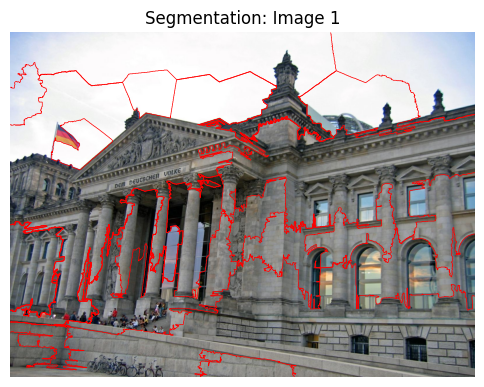

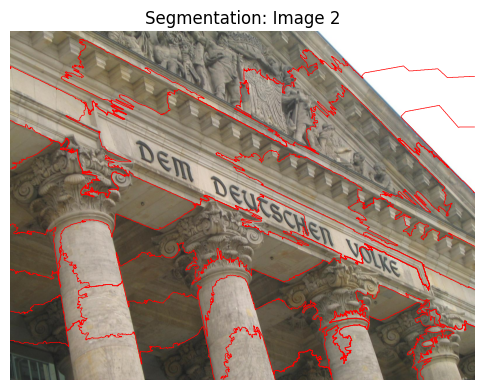

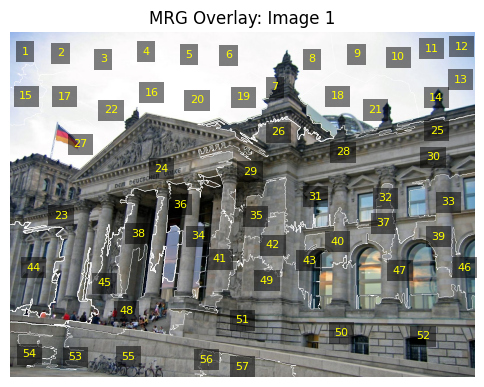

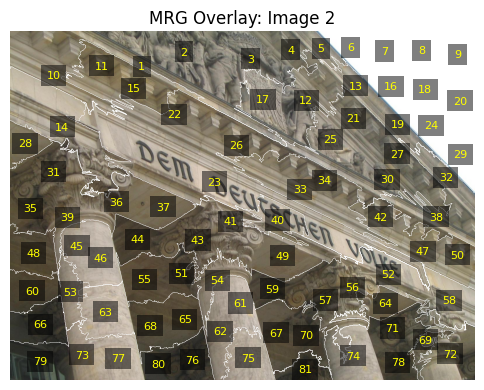

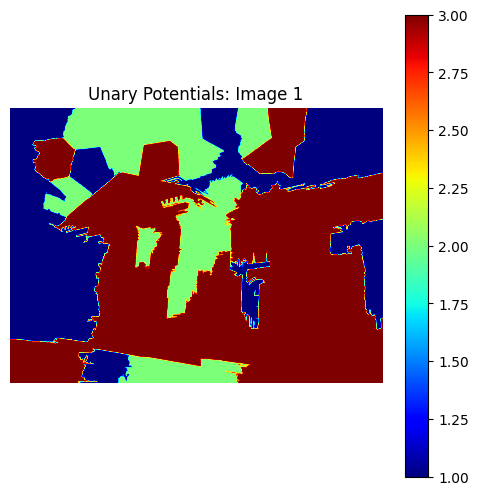

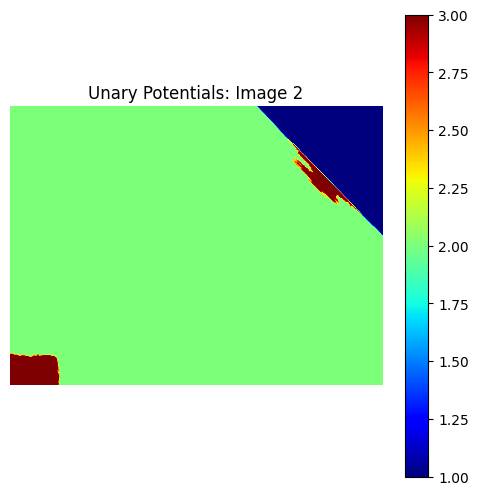

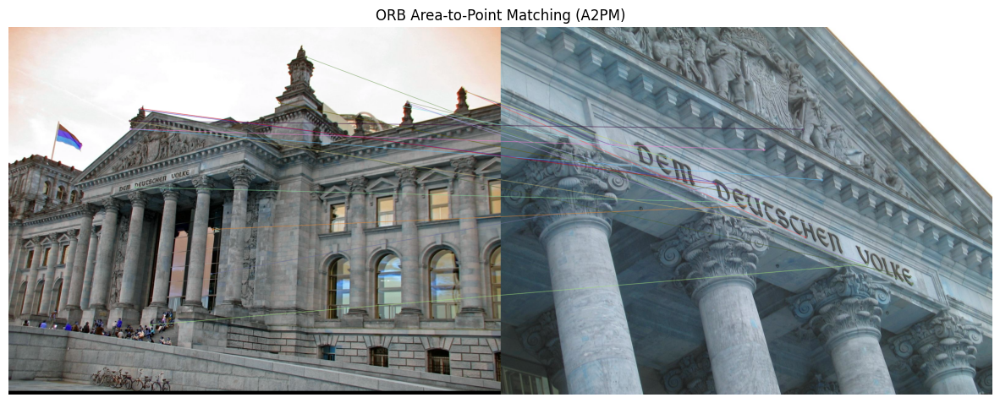

In [13]:
# --- SAMPLE EXECUTION WITH DUMMY IMAGES ---
img1 = cv2.imread('/kaggle/input/megadepth-v1-p2/MegaDepth_v1_p2/0048/dense0/imgs/1119628220_8328721e8b_o.jpg')
img2 = cv2.imread('/kaggle/input/megadepth-v1-p2/MegaDepth_v1_p2/0048/dense0/imgs/1125324576_ed37cfe788_o.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

full_amrf_pipeline(img1, img2)
